# SIFT Feature Matching with RANSAC

This notebook demonstrates SIFT feature detection and matching between two images, comparing results with and without RANSAC.

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Import required functions from sift_useful.py
from sift_useful import ( 
    match_descriptors, ransac_match, visualize_keypoints, visualize_matches, sift, visualize_matches_in_subplot, detect_and_match_features, compare_ransac_matching, warp_image, add_weighted
)
from homography_manual import compute_transformed_coordinates, warp_perspective_manual

## Load and Process Images

In [3]:
def load_images(img_path1, img_path2):
    """
    Load two images for feature matching
    """
    # Load images
    img1 = cv2.imread(img_path1)
    img2 = cv2.imread(img_path2)
    
    # Convert from BGR to RGB for visualization
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
    
    # Convert to grayscale for feature detection
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    return img1_rgb, img2_rgb, img1_gray, img2_gray

def display_images(img1, img2, title1="Image 1", title2="Image 2"):
    """
    Display two images side by side
    """
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title(title1)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title(title2)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## Feature Detection and Matching

## Compare Matching With and Without RANSAC

## Test with Sample Images

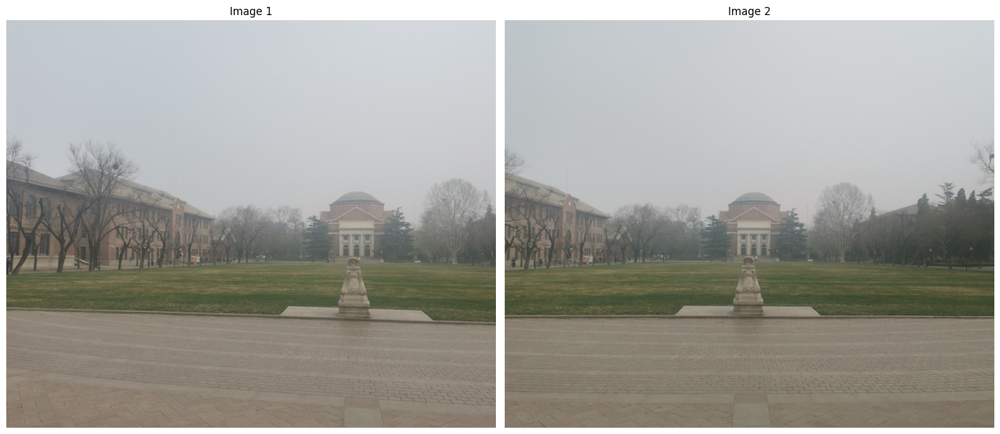

In [4]:
# Specify the paths to your images here
image_path1 = "building_2.jpg"  # Replace with your image path
image_path2 = "building_3.jpg"  # Replace with your image path

# Load and display images
img1_rgb, img2_rgb, img1_gray, img2_gray = load_images(image_path1, image_path2)
display_images(img1_rgb, img2_rgb, "Image 1", "Image 2")

Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  8753
find keypoints in octave:  1  keypoints number:  753
find keypoints in octave:  2  keypoints number:  116
find keypoints in octave:  3  keypoints number:  23
total keypoints number:  9645
redo the keypoints detection... last contrast_threshold:  0.6
find keypoints in octave:  0  keypoints number:  8706
find keypoints in octave:  1  keypoints number:  740
find keypoints in octave:  2  keypoints number:  116
find keypoints in octave:  3  keypoints number:  22
total keypoints number:  9584
redo the keypoints detection... last contrast_threshold:  0.63
find keypoints in octave:  0  keypoints number:  8588
find keypoints in octave:  1  keypoints number:  723
find keypoints in octave:  2  keypoints number:  116
find keypoints in octave:  3  keypoints number:  22
total keypoints number:  9449
redo the keypoints detection... last contrast_threshold:  0.6615000000000001
find keypoints in octave:  0  keypoints numbe

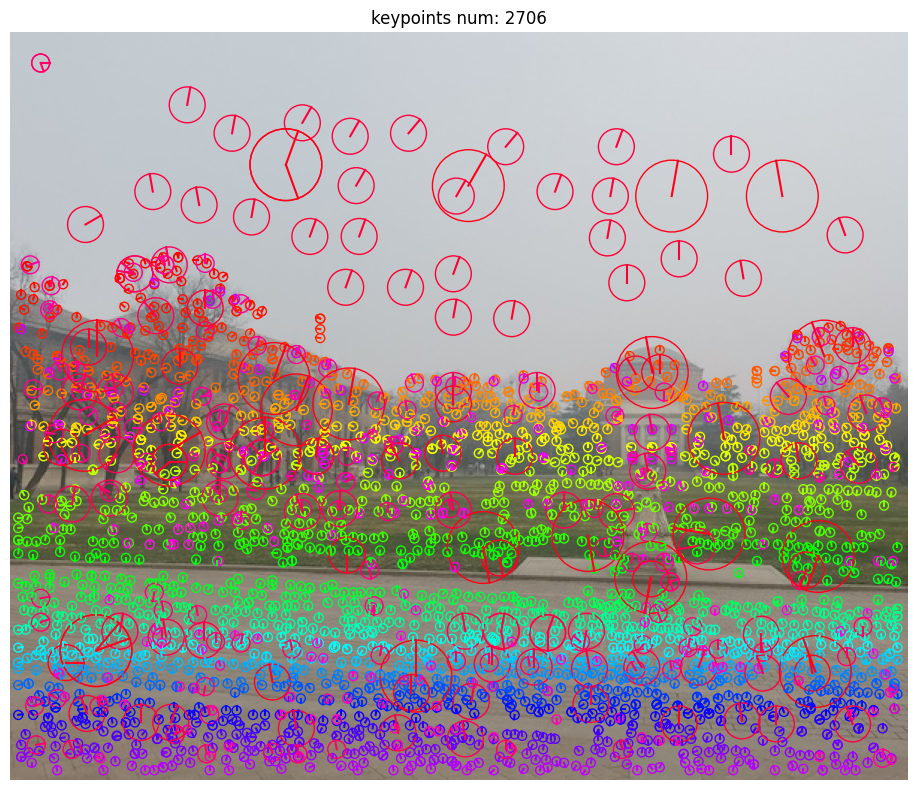

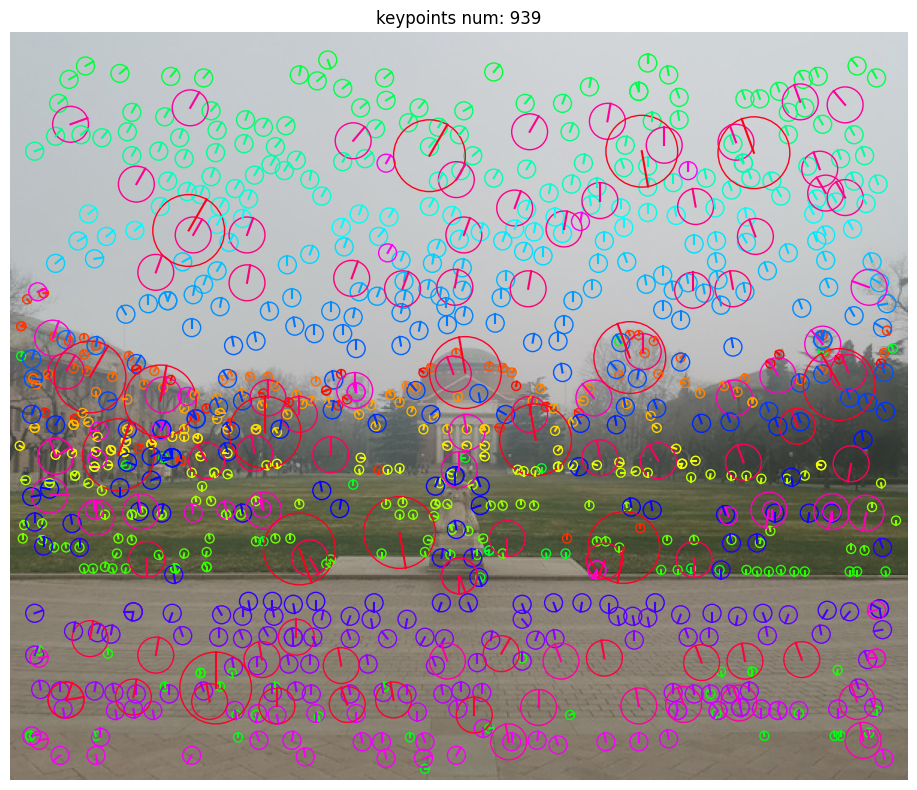

In [ ]:
# Detect and match features
keypoints1, keypoints2, matches = detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.7, edge_threshold=10, ratio_threshold=0.75)

# Show some keypoints
visualize_keypoints(img1_rgb, keypoints1) 
visualize_keypoints(img2_rgb, keypoints2)  

RANSAC inliers: 128 out of 181 matches
Inlier ratio: 70.72%


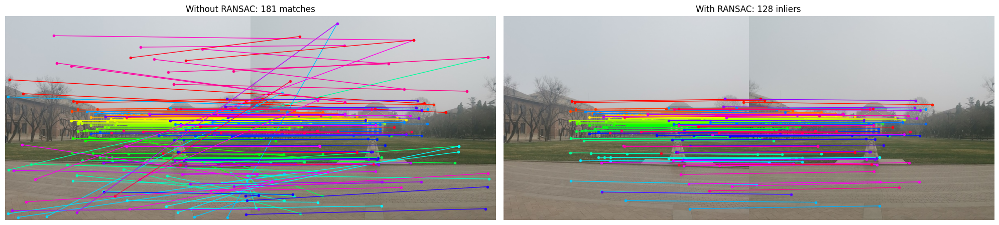

In [6]:
# Compare matching with and without RANSAC
ransac_matches, homography = compare_ransac_matching(img1_rgb, img2_rgb, keypoints1, keypoints2, matches)

## Image Registration with Homography (Optional)

In [7]:

def warp_image(img1, img2, homography):
    """
    Warp img1 to align with img2 using the homography matrix
    """
    if homography is None:
        print("No valid homography found")
        return
    
    # Get image dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Define the corners of img1
    corners = np.array([[0, 0], [0, h1], [w1, h1], [w1, 0]], dtype=np.float32)
    
    # Transform the corners using the homography
    transformed_corners = compute_transformed_coordinates(homography, corners)
    
    # Find the min and max x, y coordinates
    min_x = min(np.min(transformed_corners[:, 0]), 0)
    min_y = min(np.min(transformed_corners[:, 1]), 0)
    max_x = max(np.max(transformed_corners[:, 0]), w2)
    max_y = max(np.max(transformed_corners[:, 1]), h2)
    
    # Create a translation matrix to shift the result
    translation = np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]])
    
    # Combine the homography with the translation
    warp_matrix = translation @ homography
    
    # Define the output size of the warped image
    output_width = int(max_x - min_x)
    output_height = int(max_y - min_y)
    
    # Warp img1 using the combined matrix
    warped_img1 = warp_perspective_manual(img1, warp_matrix, (output_width, output_height))
    
    # Create a canvas for img2 of the same size
    img2_canvas = np.zeros((output_height, output_width, 3), dtype=np.uint8)
    img2_canvas[-int(min_y):h2-int(min_y), -int(min_x):w2-int(min_x)] = img2
    
    # Display the results
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 3, 1)
    plt.title("Original Image 1")
    plt.imshow(img1)
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.title("Warped Image 1")
    plt.imshow(warped_img1)
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.title("Image 2")
    plt.imshow(img2_canvas)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # strategy: If the pixel are duplicated, take the average of the pixel values
    mask1 = warped_img1.any(axis=2)  
    mask2 = img2_canvas.any(axis=2)
    overlap_mask = mask1 & mask2  # Find the overlapping region

    blended = warped_img1.copy()
    blended[~mask1] = img2_canvas[~mask1]  # Copy non-overlapping regions

    blended_overlap = add_weighted(warped_img1, 0.5, img2_canvas, 0.5)  # Blend overlapping regions
    blended[overlap_mask] = blended_overlap[overlap_mask]
    
    plt.figure(figsize=(15, 12))
    plt.title("Blended Result")
    plt.imshow(blended)
    plt.axis('off')
    plt.show()
    
    return warped_img1, img2_canvas, blended, overlap_mask
# Try warping the image if homography is available
#if homography is not None:
    #warped_img1, img2_canvas, blended, overlap_mask = warp_image(img1_rgb, img2_rgb, homography)

'''
blended_optimized = optimize_boundary(blended, warped_img1, img2_canvas, overlap_mask)
plt.figure(figsize=(12, 10))
plt.title("Optimized Blended Result")
plt.imshow(blended_optimized)
plt.axis('off')
plt.show()'
'''

'\nblended_optimized = optimize_boundary(blended, warped_img1, img2_canvas, overlap_mask)\nplt.figure(figsize=(12, 10))\nplt.title("Optimized Blended Result")\nplt.imshow(blended_optimized)\nplt.axis(\'off\')\nplt.show()\'\n'

## Do the 4 images sythesize

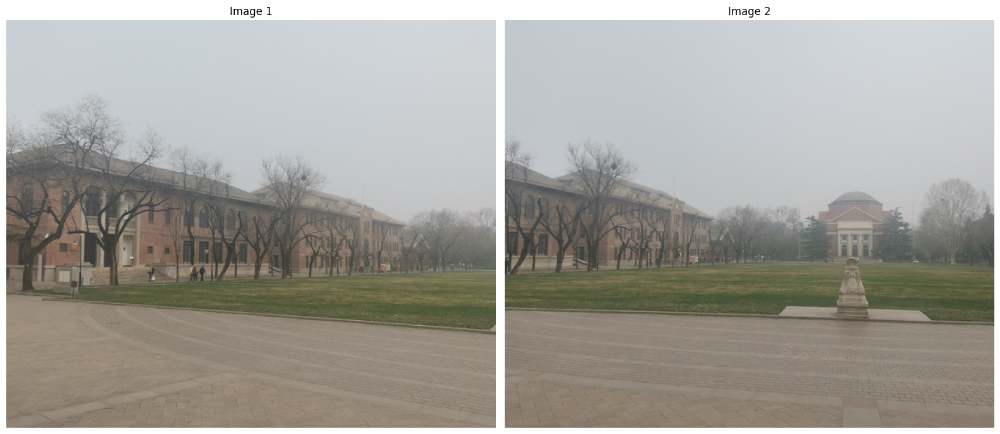

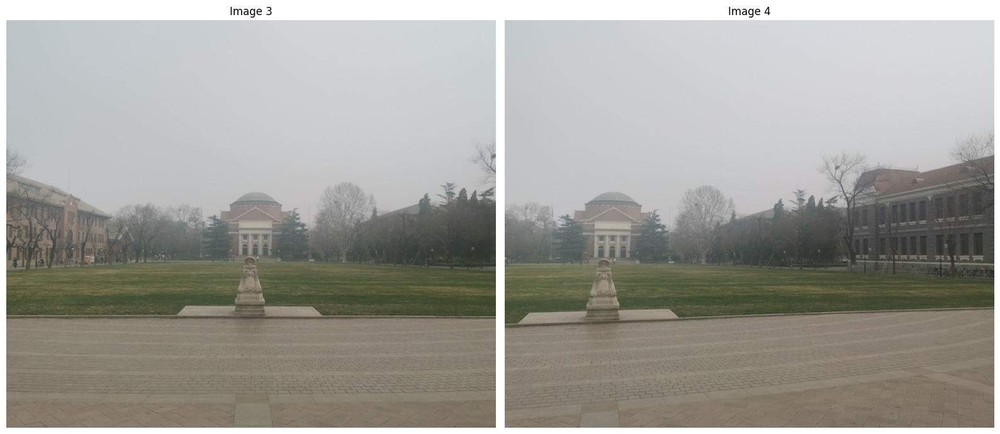

In [8]:
image_path1 = "building_1.jpg"  # Replace with your image path
image_path2 = "building_2.jpg"  # Replace with your image path
image_path3 = "building_3.jpg"  # Replace with your image path
image_path4 = "building_4.jpg"  # Replace with your image path

# Load and display images
img1_rgb, img2_rgb, img1_gray, img2_gray = load_images(image_path1, image_path2)
display_images(img1_rgb, img2_rgb, "Image 1", "Image 2")
img3_rgb, img4_rgb, img3_gray, img4_gray = load_images(image_path3, image_path4)
display_images(img3_rgb, img4_rgb, "Image 3", "Image 4")

Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  3352
find keypoints in octave:  1  keypoints number:  289
find keypoints in octave:  2  keypoints number:  115
find keypoints in octave:  3  keypoints number:  25
total keypoints number:  3781
redo the keypoints detection... last contrast_threshold:  0.7
find keypoints in octave:  0  keypoints number:  879
find keypoints in octave:  1  keypoints number:  110
find keypoints in octave:  2  keypoints number:  114
find keypoints in octave:  3  keypoints number:  25
total keypoints number:  1128
Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  8190
find keypoints in octave:  1  keypoints number:  682
find keypoints in octave:  2  keypoints number:  115
find keypoints in octave:  3  keypoints number:  22
total keypoints number:  9009
redo the keypoints detection... last contrast_threshold:  0.7
find keypoints in octave:  0  keypoints number:  5606
find keypoints in octave:  1  keypoints num

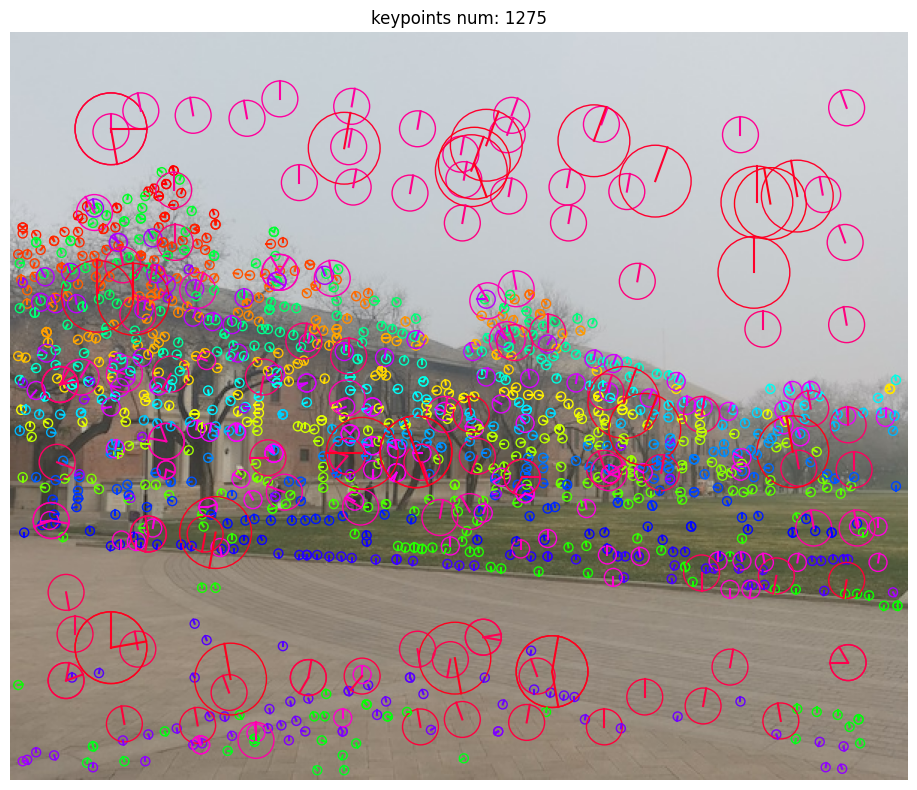

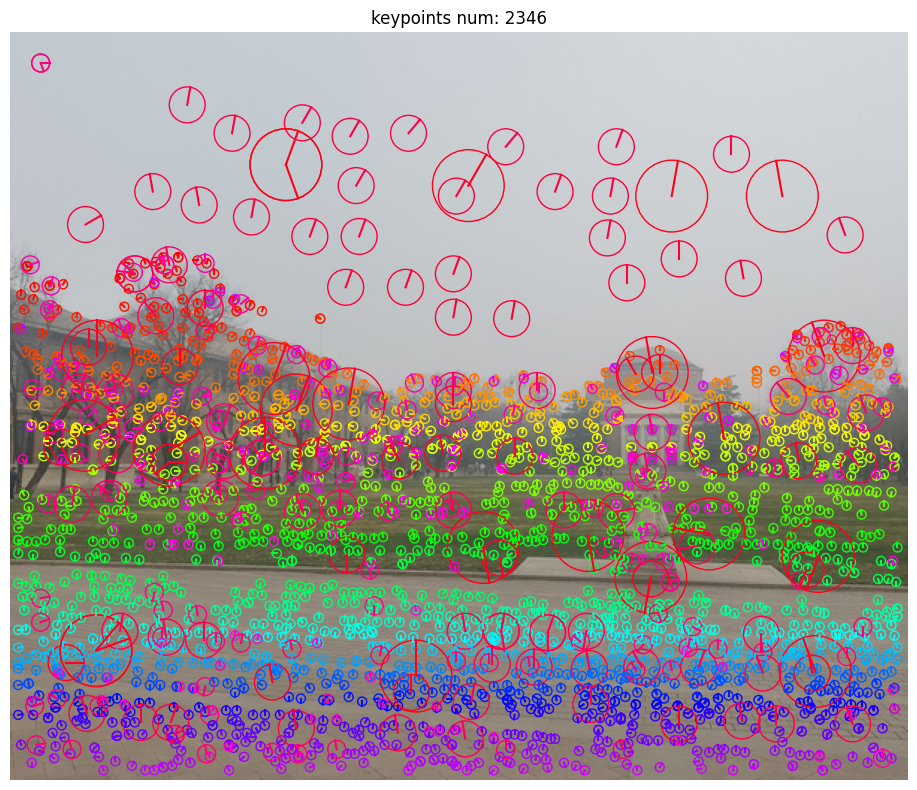

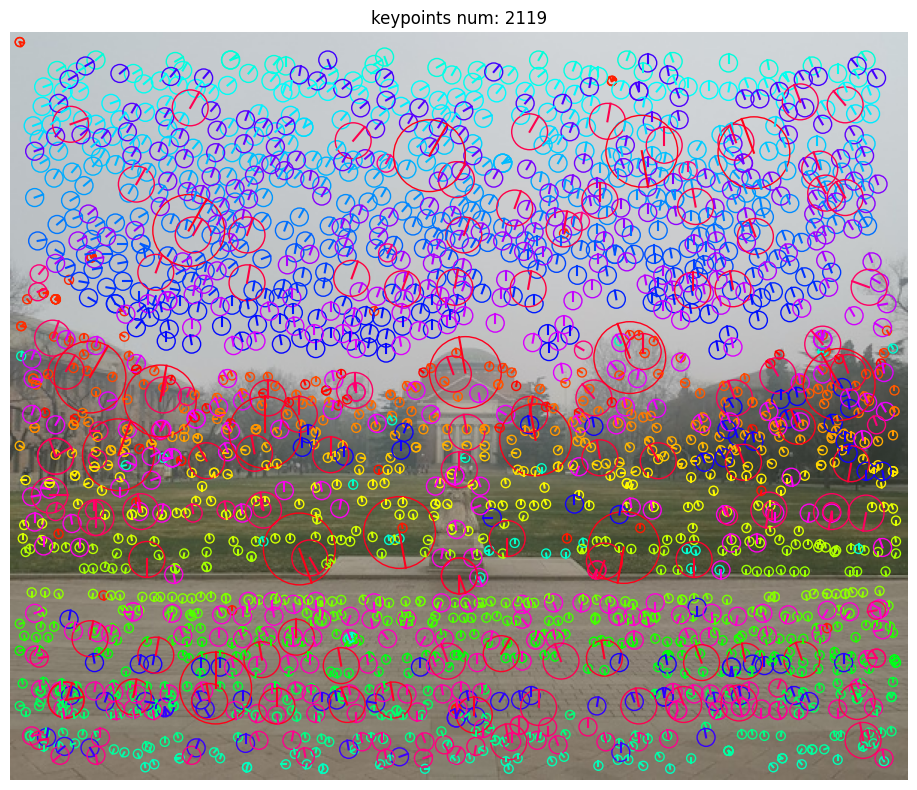

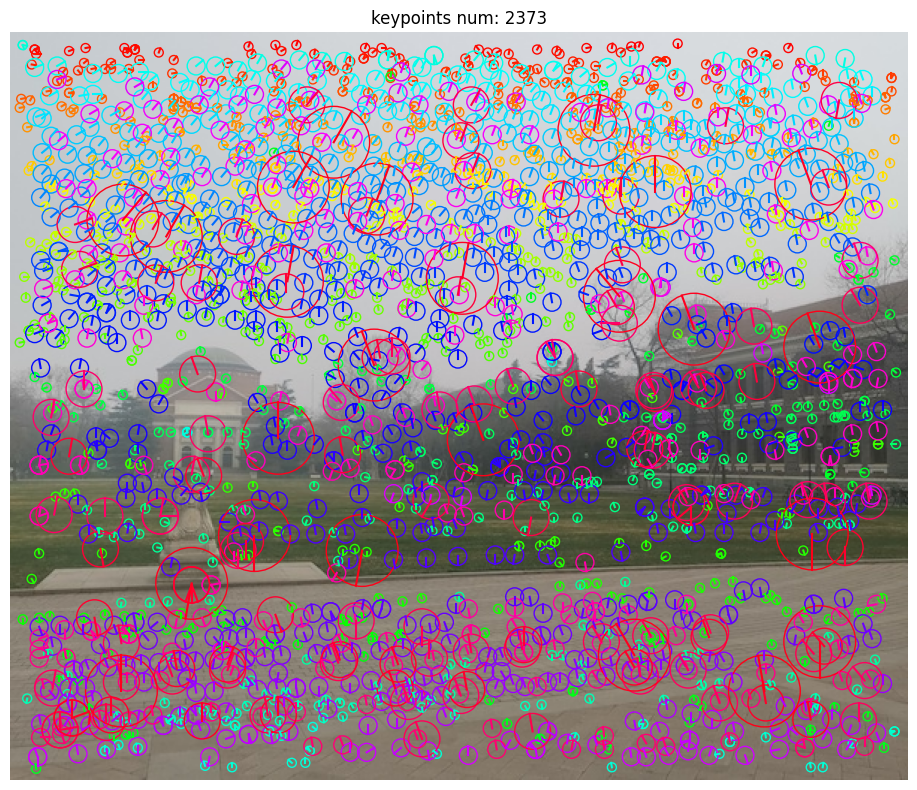

In [9]:
# Detect and match features
keypoints1, keypoints2, matches = detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.7, edge_threshold=10, ratio_threshold=0.7)
keypoints4, keypoints3,  matches2 = detect_and_match_features(img4_gray, img3_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.7, edge_threshold=10, ratio_threshold=0.7)

# Show some keypoints
visualize_keypoints(img1_rgb, keypoints1)
visualize_keypoints(img2_rgb, keypoints2)
visualize_keypoints(img3_rgb, keypoints3)
visualize_keypoints(img4_rgb, keypoints4)

RANSAC inliers: 88 out of 98 matches
Inlier ratio: 89.80%


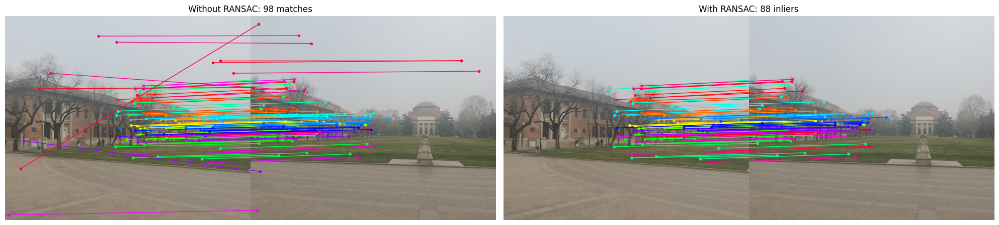

RANSAC inliers: 40 out of 129 matches
Inlier ratio: 31.01%


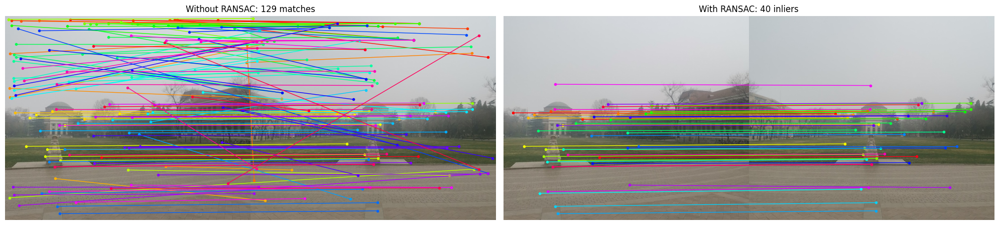

100%|██████████| 705/705 [00:02<00:00, 332.52it/s]


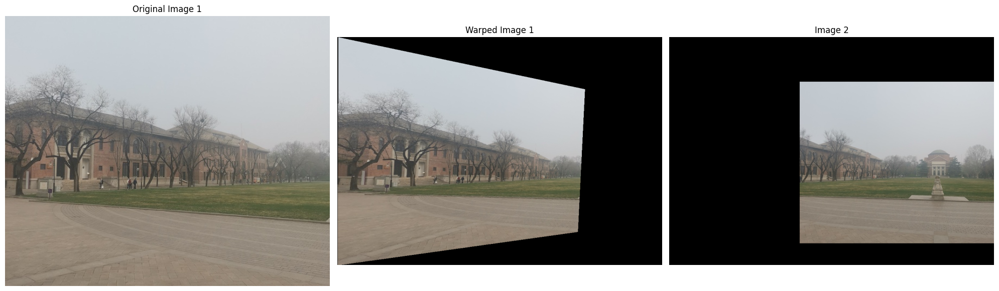

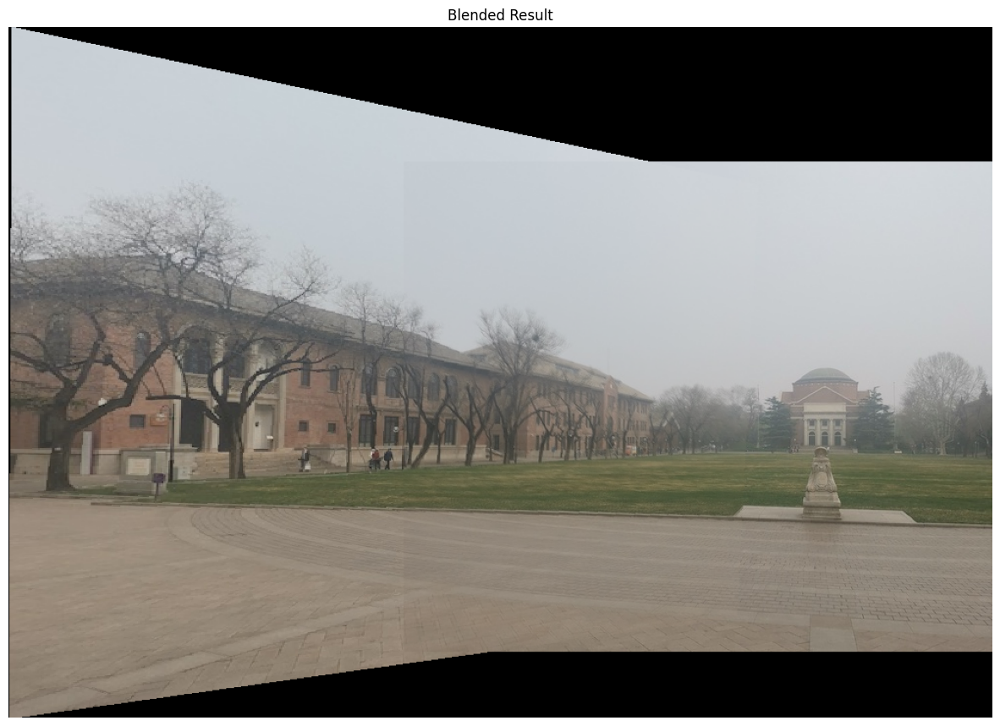

100%|██████████| 638/638 [00:01<00:00, 357.78it/s]


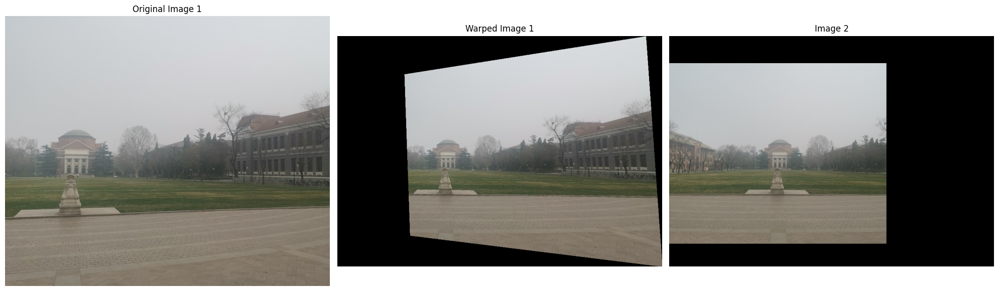

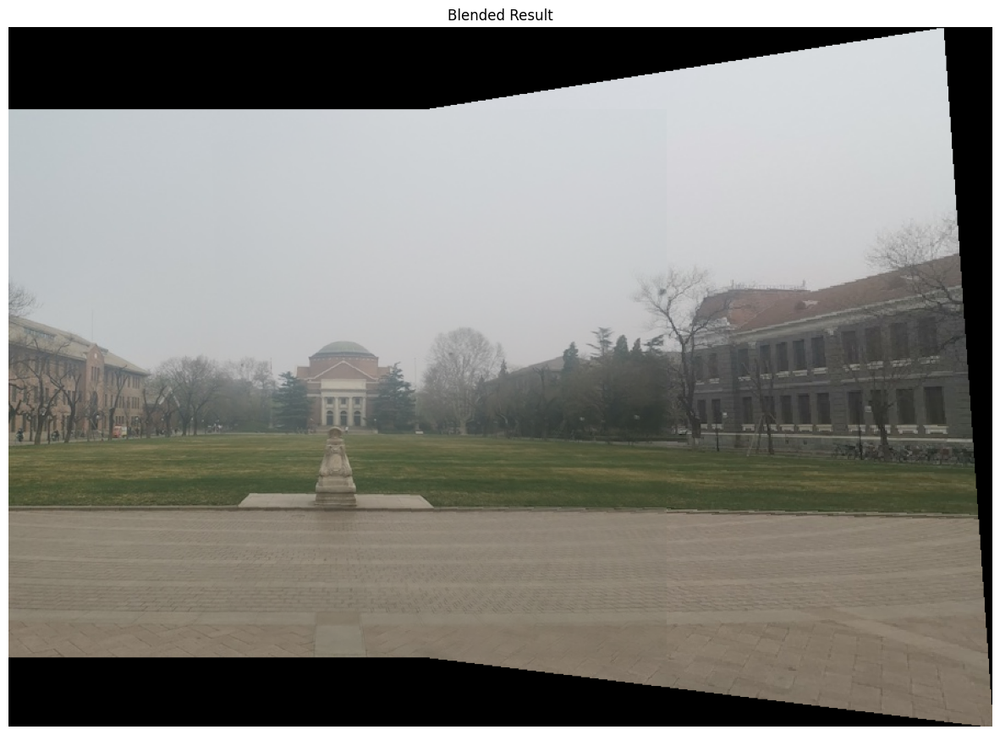

In [10]:
# Compare matching with and without RANSAC
ransac_matches, homography = compare_ransac_matching(img1_rgb, img2_rgb, keypoints1, keypoints2, matches)
ransac_matches2, homography2 = compare_ransac_matching(img4_rgb,img3_rgb, keypoints4,  keypoints3, matches2)
warped_img1, img2_canvas, blended, overlap_mask = warp_image(img1_rgb, img2_rgb, homography)
img4_canvas, warped_img3, blended2, overlap_mask2 = warp_image(img4_rgb, img3_rgb, homography2)

Initial Shape:  (705, 1003)
find keypoints in octave:  0  keypoints number:  2831
find keypoints in octave:  1  keypoints number:  679
find keypoints in octave:  2  keypoints number:  346
find keypoints in octave:  3  keypoints number:  63
total keypoints number:  3919
redo the keypoints detection... last contrast_threshold:  0.65
find keypoints in octave:  0  keypoints number:  1010
find keypoints in octave:  1  keypoints number:  276
find keypoints in octave:  2  keypoints number:  124
find keypoints in octave:  3  keypoints number:  34
total keypoints number:  1444
Initial Shape:  (638, 897)
find keypoints in octave:  0  keypoints number:  797
find keypoints in octave:  1  keypoints number:  403
find keypoints in octave:  2  keypoints number:  92
find keypoints in octave:  3  keypoints number:  22
total keypoints number:  1314
Image 1: 1659 keypoints
Image 2: 1416 keypoints
Total matches: 93
RANSAC inliers: 82 out of 93 matches
Inlier ratio: 88.17%


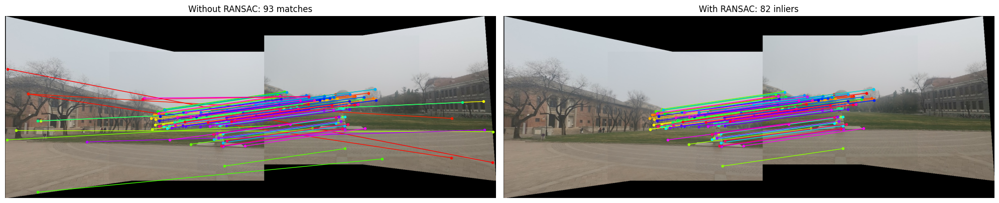

100%|██████████| 1037/1037 [00:34<00:00, 30.42it/s]


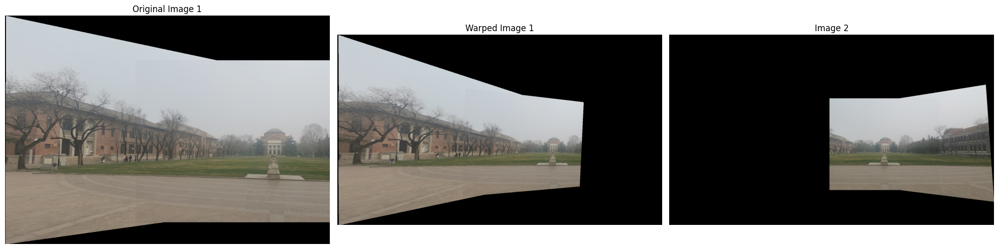

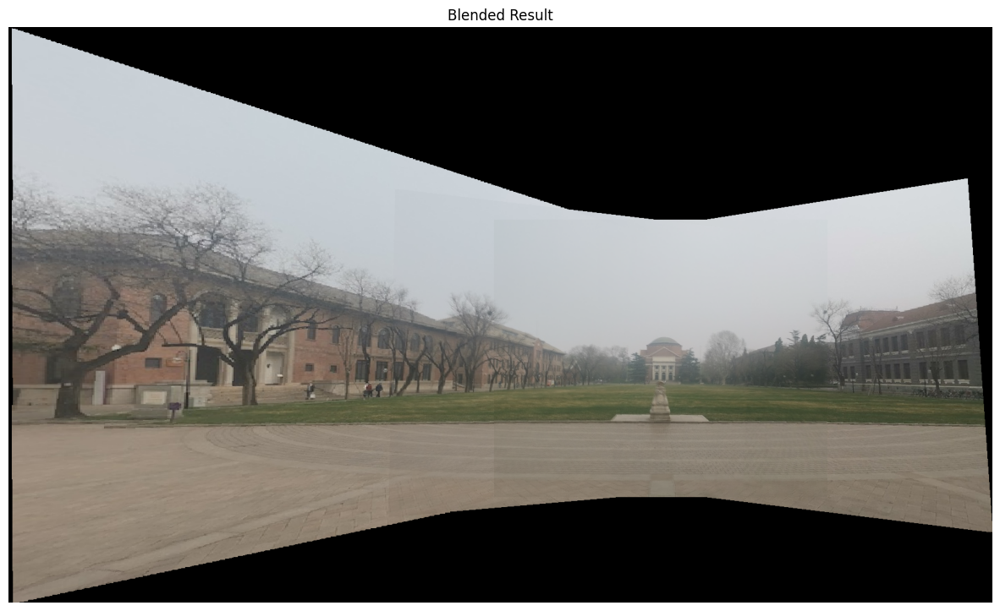

In [11]:
img1_gray = blended
img2_gray = blended2
keypoints1, keypoints2, matches = detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.65, edge_threshold=10, ratio_threshold=0.75)
ransac_matches, homography = compare_ransac_matching(img1_gray, img2_gray, keypoints1, keypoints2, matches)
warped_img1, img2_canvas, blended, overlap_mask = warp_image(img1_gray, img2_gray, homography)

## Conclusion

This notebook demonstrated how to use SIFT for feature detection and matching between two images, comparing the results with and without RANSAC. RANSAC helps filter out incorrect matches by finding a consistent transformation (homography) between the images.

Key observations:
1. Regular feature matching may include many incorrect matches
2. RANSAC effectively filters out these outliers
3. The resulting homography can be used for image alignment and stitching